# Project: Advanced Lane Finding

## Import packages

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob


%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## Help functions

In [3]:
output_images_dir = './output_images/'

In [4]:
def display_images(images, titles=None, cols=2, cmap=None, filename=None):
    rows = (len(images) + 1) // cols
    plt.figure(figsize=(15, 17))
    for i in range(len(images)):
        plt.subplot(rows, cols, i + 1)
        image = images[i]
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image, cmap=cmap)
        if titles:
            plt.title(titles[i])
        plt.xticks([])
        plt.yticks([])
#         plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
#     plt.subplots_adjust(bottom=0, left=0, right=0, top=0, hspace=0)
    plt.tight_layout()
    if filename:
        fname = output_images_dir + filename
        plt.savefig(fname)
        
    plt.show()


## Camera calibration

Image distortion occurs when a camera looks at 3D objects in the real world and transforms them into a 2D image; this transformation isn’t perfect. Distortion actually changes what the shape and size of these 3D objects appear to be. So, the first step in analyzing camera images, is to undo this distortion so that you can get correct and useful information out of them. To do that, we will compute the camera calibration matrix and distortion coefficients given a set of chessboard images. Then, we will apply a distortion correction to raw images.

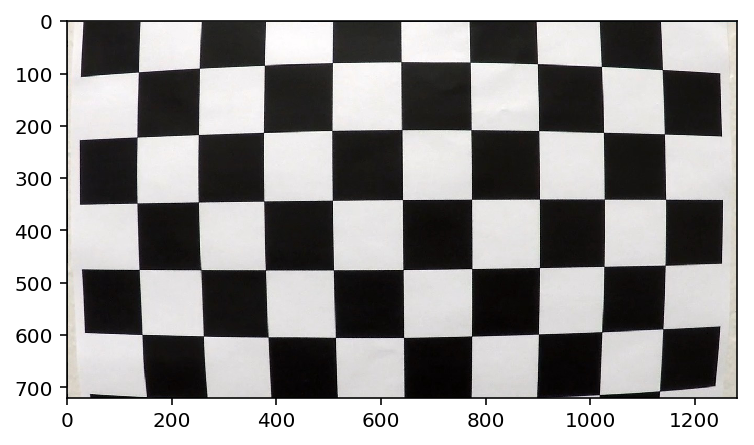

In [5]:
# read in a calibration image
img = mpimg.imread("./camera_cal/calibration1.jpg")
plt.imshow(img)

Let's Count the number of corners in any given row and enter that value in **nx**. Similarly, count the number of corners in a given column and store that in **ny**. Keep in mind that "corners" are only points where two black and two white squares intersect, in other words, only count inside corners, not outside corners.

We obtain a 9x6 chessboard.

In [6]:
nx = 9
ny = 6

In [7]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0)  ...,(8,4,0)
objp = np.zeros((ny*nx, 3), np.float32)
# the coordinate are in teh form of (x, y, z) and z remains 0 for all coordinate but for
# x & y we use numpy grid function to generate coodinates that we want
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

# Arrays to store object points and image points from all the images
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# make a list of calibration images
images = glob.glob("./camera_cal/calibration*.jpg")
chessboard_images = []
titles = []
count = 0

#step through the list and search for chessboard corners
for i, fname in enumerate(images):
    if i % 5 == 0:
        print("{} of {}".format((i+1), len(images)))
    img = cv2.imread(fname)
    chessboard_images.append(img)
    titles.append("original")
    
    # convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # if found add object points and images points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # draw and display the corners
        chess = img.copy()
        chess = cv2.drawChessboardCorners(chess, (nx, ny), corners, ret)
        chessboard_images.append(chess)
        titles.append("Chessboard found")
        count += 1
    else:
        chessboard_images.append(img)
        titles.append("No chessboard found")
print("Found {} chessboard corners for {} images".format(count, len(images)))

1 of 20
6 of 20
11 of 20
16 of 20
Found 17 chessboard corners for 20 images


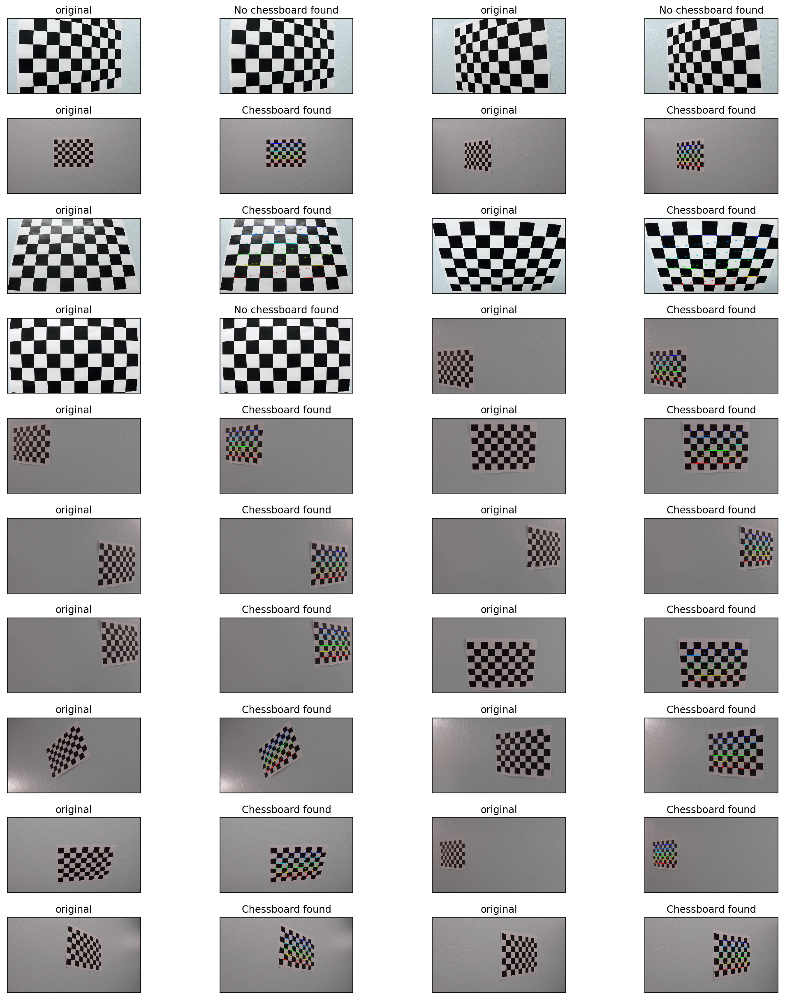

In [8]:
display_images(chessboard_images, titles, cols=4, filename='chessboard_corners.jpg')

### Correcting for distorsion

Let's use the output objpoints and imgpoints to compute the camera calibration and distortion coefficients using the cv2.calibrateCamera() function. We apply this distortion correction to the test image using the cv2.undistort() function.

In [9]:
def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

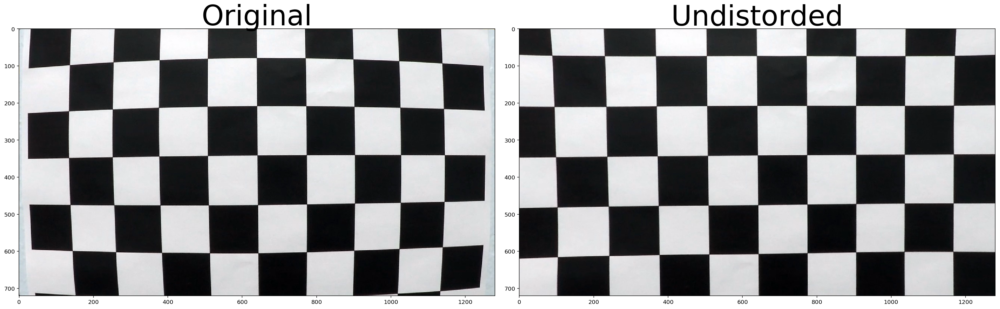

In [10]:
distorded = cv2.imread('./camera_cal/calibration1.jpg')
undistorted = cal_undistort(distorded, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(distorded)
ax1.set_title('Original', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorded', fontsize=50)
plt.subplots_adjust(left=0., right=1., top=0.9, bottom=0.)

fname = output_images_dir + "undistortion.jpg"
plt.savefig(fname)

## Color and gradient threshold


In [11]:
test_images = glob.glob("./test_images/*.jpg")

### Color thresholding
Let's separate channels and see how each color space handle the yellow and white lines under different conditions. 

#### HLS

In [12]:
def hls_select(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    return h_channel, l_channel, s_channel

In [13]:
hls_img = []
titles = []

for fname in test_images:
    image = mpimg.imread(fname)
    hls_img.append(image)
    titles.append('Original')
    
    h_channel, l_channel, s_channel = hls_select(image)
    hls_img.extend([h_channel, l_channel, s_channel])
    titles.extend(["H", "L", "S"])

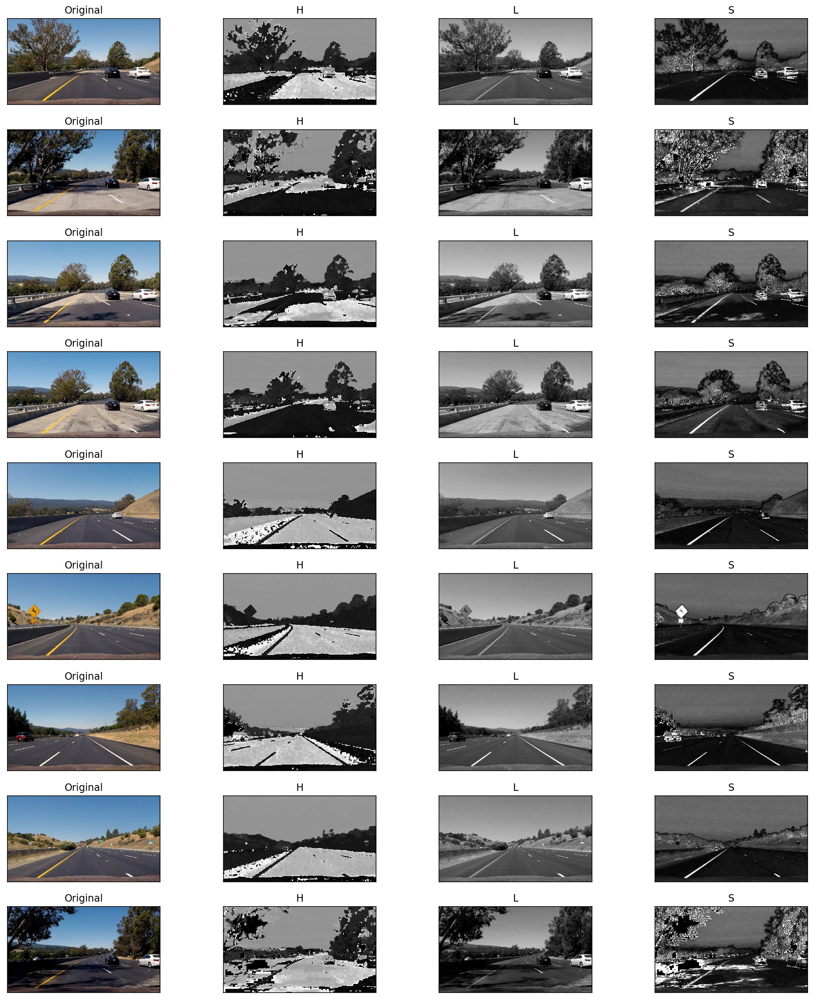

In [14]:
display_images(hls_img, titles, cols=4, filename='hls_channels_separations.jpg')

**1) White lanes**

Using a color conversion tool, for example [this one](https://www.w3schools.com/colors/colors_hsl.asp), we can see that the white color range approximatively from 200 to 255 for the L channel. Let's try to apply that.

In [33]:
def hls_select_white(img, thresh=(200, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    binary_output = np.zeros_like(l_channel)
    binary_output[(l_channel > thresh[0]) & (l_channel <= thresh[1])] = 1
    return binary_output

In [34]:
hls_white_img = []
titles = []

for fname in test_images:
    image = mpimg.imread(fname)
    hls_white_img.append(image)
    titles.append('Original')
    
    white_line = hls_select_white(image)
    hls_white_img.append(white_line)
    titles.append("White line")

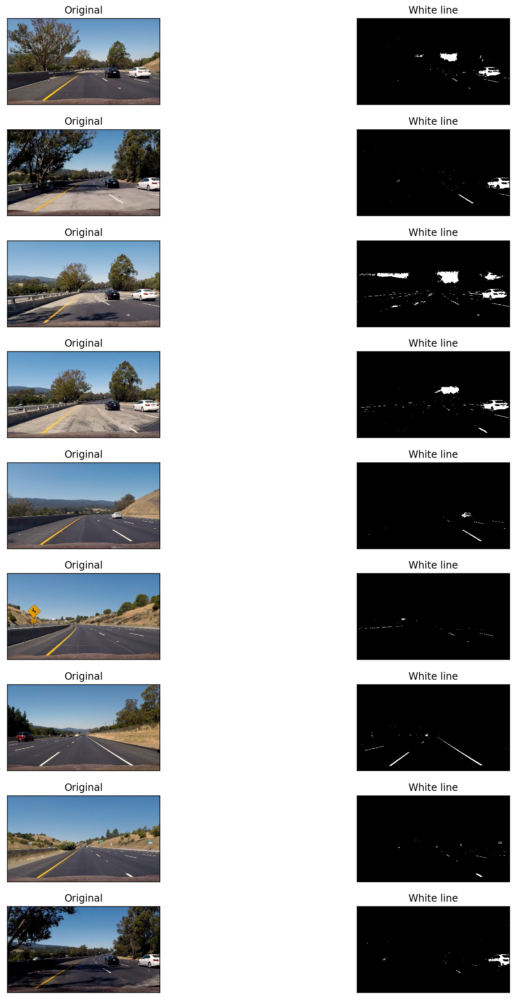

In [35]:
display_images(hls_white_img, titles, cols=2, filename='white_lines.jpg')

We see that we are able to easily extract white lanes in "good" images, that is those that don't have shadow.

**2) Yellow lanes**

In [57]:
def hls_select_yellow(img, h_thresh=(10, 40), s_thresh=(100, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel = hls[:,:,0]
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
#     binary_output[(h_channel > h_thresh[0]) & (l_channel <= h_thresh[1]) & 
#                   (s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    binary_output[(s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    return binary_output

In [58]:
hls_yellow_img = []
titles = []

for fname in test_images:
    image = mpimg.imread(fname)
    hls_yellow_img.append(image)
    titles.append('Original')
    
    yellow_line = hls_select_yellow(image)
    hls_yellow_img.append(yellow_line)
    titles.append("Yellow line")

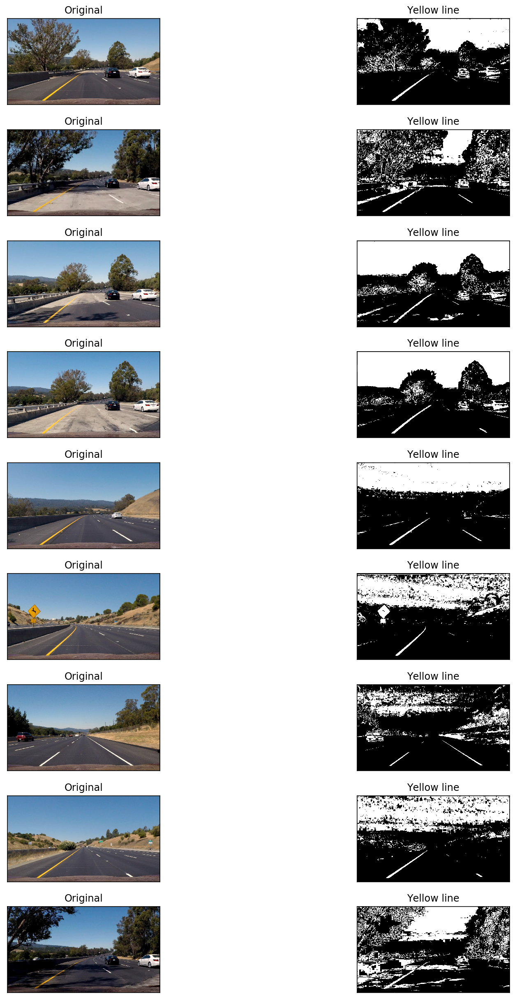

In [59]:
display_images(hls_yellow_img, titles, cols=2, filename='yellow_lines.jpg')

We see that by using a threshold on the s-channel, we are able to extract yellow lines.

#### Thresholding Combination

Let's combine color and gradient thresholding to detect edges.

In [18]:
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx) #Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx/np.max(abs_sobelx))
    
    # threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # threshold color chanel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sxbinary == 1) | (s_binary == 1)] = 1
    return color_binary, combined_binary

In [19]:
# image = mpimg.imread('test_images/shadow1.jpg')
test_images = glob.glob("./test_images/*.jpg")
results_img = []
titles = []

for fname in test_images:
    image = mpimg.imread(fname)
    results_img.append(image)
    titles.append('Original')
    
    color_binary, combined_binary = pipeline(image)
    results_img.extend([color_binary, combined_binary])
    titles.extend(["Stacked thresholds", "Combined S channel & gradient thresholds"])

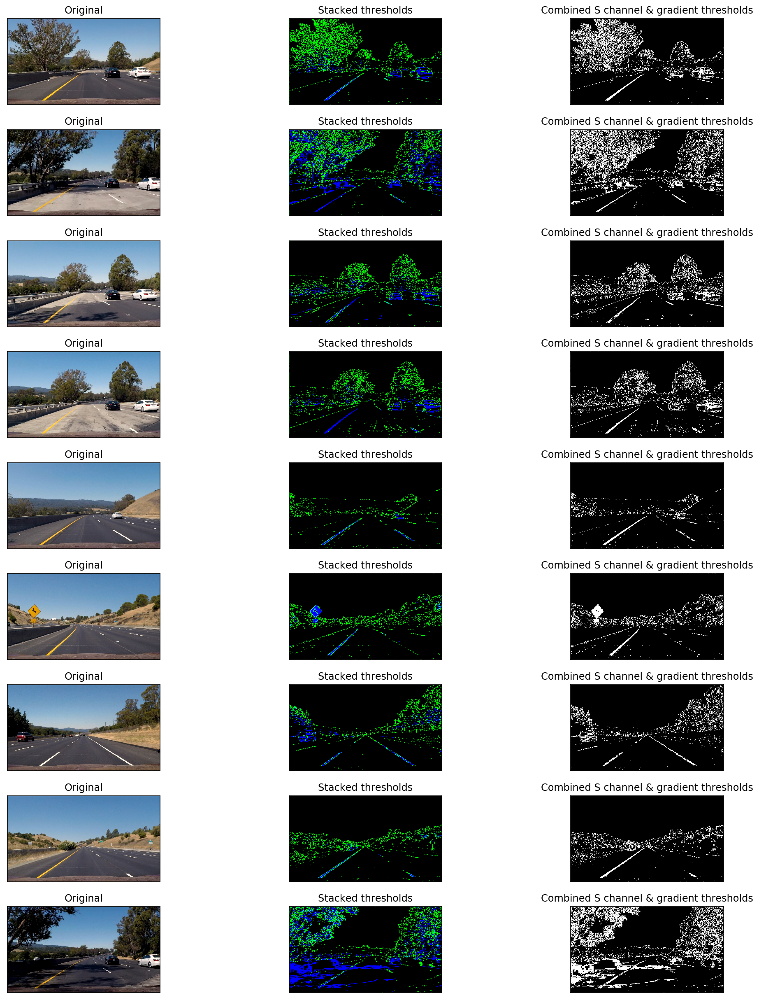

In [20]:
display_images(results_img, titles, cols=3, filename='color_gradient_thresholds.jpg')